# This notebook goes through examples of the kind of files available in version SV3 LSS catalogs

In [1]:
import fitsio
from matplotlib import pyplot as plt
from astropy.table import Table,join
from astropy.time import Time
import numpy as np
import os
from matplotlib import pyplot as plt

In [2]:
from desitarget.sv3 import sv3_targetmask

In [3]:
bdir = '/global/cfs/cdirs/desi/survey/catalogs/SV3/LSS/'

## First, look at files that contain all target info, cut to the area around rosettes

765698 dark targets in greater area of SV3 rosettes
555863 bright targets in greater area of SV3 rosettes


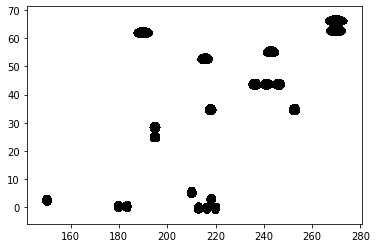

In [9]:
fd = fitsio.read(bdir+'dark_targets.fits') #dark
print(str(len(fd))+' dark targets in greater area of SV3 rosettes')
fb = fitsio.read(bdir+'bright_targets.fits') #bright
print(str(len(fb))+' bright targets in greater area of SV3 rosettes')

plt.plot(fd['RA'],fd['DEC'],'k,')
plt.show()
#each area is just a circle, so this nicely shows the distortion mostly along RA

In [14]:
#look at break down by type
typesd = ['ELG','ELG_HIP','LRG','QSO']
for tp in typesd:
    selt = (sv3_targetmask.desi_mask[tp] & fd['SV3_DESI_TARGET']) > 0
    print(tp+': '+str(len(fd[selt])))

ELG: 529905
ELG_HIP: 432842
LRG: 168963
QSO: 68586


In [15]:
typesd = ['BGS_ANY','MWS_ANY']
for tp in typesd:
    selt = (sv3_targetmask.desi_mask[tp] & fb['SV3_DESI_TARGET']) > 0
    print(tp+': '+str(len(fb[selt])))

BGS_ANY: 289607
MWS_ANY: 266064


In [3]:
#Those numbers represent the maximum size of any of the catalogs

## Now look at files that contain info on all reachable targets

In [19]:
fd = fitsio.read(bdir+'datcomb_dark_tarwdup_Alltiles.fits')
print(str(len(fd))+' total times a dark target was reachable')
print(str(len(np.unique(fd['TARGETID'])))+' number of unique targets that were reachable') 

6318959 total times a dark target was reachable
691418 number of unique targets that were reachable


In [18]:
#Note that this contains an entry for every time a target was reachable; just under 10 times per target

In [20]:
fb = fitsio.read(bdir+'datcomb_bright_tarwdup_Alltiles.fits')
print(str(len(fb))+' total times a bright target was reachable')
print(str(len(np.unique(fb['TARGETID'])))+' number of unique bright targets that were reachable') 

4461559 total times a bright target was reachable
531487 number of unique bright targets that were reachable


## Those aren't particularly interesting on their own; now look at all observed spec data

In [21]:
#this contains info on all spec observations during dark time 
fd = fitsio.read(bdir+'daily/datcomb_dark_specwdup_Alltiles.fits')
print(len(fd))

1023252


In [23]:
#That will include everything, including sky
#cut to science targets
sel = fd['OBJTYPE'] == 'TGT'
print(len(fd[sel]))

939600


In [25]:
#this contains info on all spec observations during bright time 
fb = fitsio.read(bdir+'daily/datcomb_bright_specwdup_Alltiles.fits')
print(len(fb))
sel = fb['OBJTYPE'] == 'TGT'
print(len(fb[sel]))

908876
815448


## The merge of the target and spec files is easier to work with

In [4]:
fd = fitsio.read(bdir+'daily/datcomb_dark_tarspecwdup_Alltiles.fits')
print(len(fd))
fb = fitsio.read(bdir+'daily/datcomb_bright_tarspecwdup_Alltiles.fits')
print(len(fb))

6318959
4461559


In [5]:
wz = fd['ZWARN'] == 0 #cut to "good" redshift
fdz = fd[wz]
print(np.min(fdz['NIGHT']))

20210405


In [7]:
t = fdz['NIGHT']-np.min(fdz['NIGHT'])
w = t > 30
t[w] -= 70

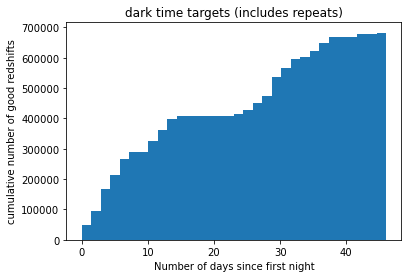

In [8]:
plt.hist(t,cumulative=True,bins=len(np.unique(t))) #plot build-up of good redshifts
plt.xlabel('Number of days since first night')
plt.ylabel('cumulative number of good redshifts')
plt.title('dark time targets (includes repeats)')
plt.show()

20210405


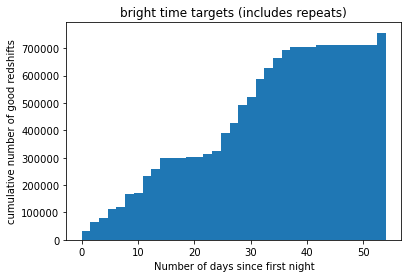

In [9]:
wz = fb['ZWARN'] == 0 #cut to "good" redshift
fbz = fb[wz]
print(np.min(fbz['NIGHT']))
t = fbz['NIGHT']-np.min(fbz['NIGHT'])
w = t > 30
t[w] -= 70
plt.hist(t,cumulative=True,bins=len(np.unique(t))) #plot build-up of good redshifts
plt.xlabel('Number of days since first night')
plt.ylabel('cumulative number of good redshifts')
plt.title('bright time targets (includes repeats)')
plt.show()

### Should use these files to study the redshift failures. Need to be careful because of the repeats

In [13]:
wz = fd['ZWARN'] != 999999 #cut to data with spec obs
wz &= fd['FIBERSTATUS'] == 0
fdz = fd[wz]
print(len(fdz))

832428


In [14]:
wp = fdz['PRIORITY'] >= 3000 #all science targets have priority at least this high on first observation; need to use just first observation for studying z failures
fdzp = fdz[wp]

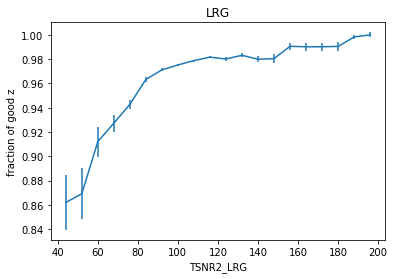

<ipython-input-22-c8e22020a515>:14: RuntimeWarning: invalid value encountered in true_divide
  arz['o2c'] = np.log10(arz['FOII']/arz['FOII_ERR'])+0.2*np.log10(arz['DELTACHI2'])
<ipython-input-22-c8e22020a515>:14: RuntimeWarning: divide by zero encountered in log10
  arz['o2c'] = np.log10(arz['FOII']/arz['FOII_ERR'])+0.2*np.log10(arz['DELTACHI2'])
<ipython-input-22-c8e22020a515>:14: RuntimeWarning: invalid value encountered in log10
  arz['o2c'] = np.log10(arz['FOII']/arz['FOII_ERR'])+0.2*np.log10(arz['DELTACHI2'])
<ipython-input-22-c8e22020a515>:15: RuntimeWarning: invalid value encountered in multiply
  w = (arz['o2c']*0) != 0


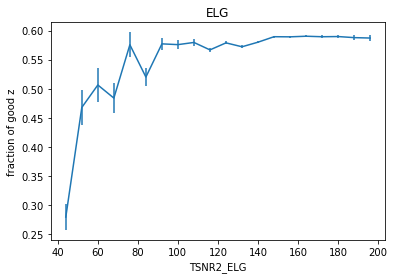

In [22]:
#look at redshift success vs TSNR for LRG and ELG
tps = ['LRG','ELG']
for tp in tps:
    selt = (sv3_targetmask.desi_mask[tp] & fdzp['SV3_DESI_TARGET']) > 0 
    ft = fdzp[selt]
    if tp == 'LRG':
        wzg = ft['ZWARN'] == 0
        wzg &= ft['DELTACHI2'] > 16
    if tp == 'ELG':
        azf = '/global/homes/r/raichoor/sv3/sv3-elg-daily-thru20210521.fits' #Anand's file with OII info
        arz = Table.read(azf)
        wg = arz['FIBERSTATUS'] == 0
        arz = arz[wg]
        arz['o2c'] = np.log10(arz['FOII']/arz['FOII_ERR'])+0.2*np.log10(arz['DELTACHI2']) 
        w = (arz['o2c']*0) != 0
        arz['o2c'][w] = -20
        arz.keep_columns(['TARGETID','LOCATION','TILEID','o2c'])
        ft = join(ft,arz,keys=['TARGETID','LOCATION','TILEID'],join_type='left')

        wzg = ft['o2c'] > 0.9 #Anand's OII criteria

    rng = (40,200)
    nb = 20
    bs = (rng[1]-rng[0])/nb    
    a = np.histogram(ft[wzg]['TSNR2_'+tp],bins=a[1])
    b = np.histogram(ft['TSNR2_'+tp],bins=nb,range=rng)
#plt.clf()
#fr = np.mean(a[0]/b[0])
    dl = a[0]/b[0]#/fr
    varl = dl*b[0]*(1.-dl) #variance for binomial distribution
    wv = varl == 0
    varl[wv] = 1
    el = np.sqrt(varl)/b[0]#/fr
    vs = a[1][:-1]+bs/2.
    plt.errorbar(vs,dl,el)        
    plt.title(tp)
    plt.xlabel('TSNR2_'+tp)
    plt.ylabel('fraction of good z')
    #plt.legend(loc='upper left')
    plt.show()        

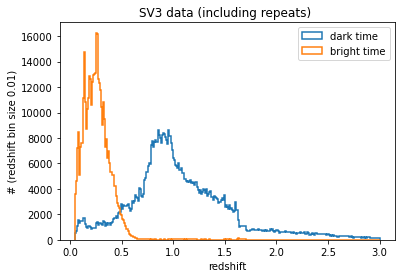

In [23]:
#look at total redshift distributions for both
wz = fd['ZWARN'] == 0
zx = 3
zm = 0.05
nbin = int((zx-zm)/.01)
plt.hist(fd[wz]['Z'],range=(0.05,3),bins=nbin,histtype='step',label='dark time',lw=1.5)
wzb = fb['ZWARN'] == 0
#wzb &= fb['DELTACHI2'] > 40
plt.hist(fb[wzb]['Z'],range=(0.05,3),bins=nbin,histtype='step',label='bright time',lw=1.5)
plt.xlabel('redshift')
plt.ylabel('# (redshift bin size 0.01)')
plt.title('SV3 data (including repeats) ')
plt.legend()
plt.show()

## Now, move on to "full" files split by target type

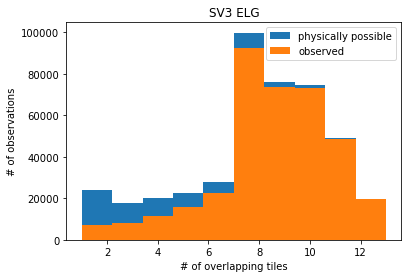

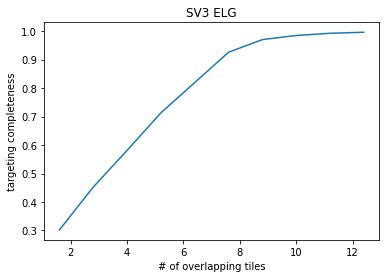

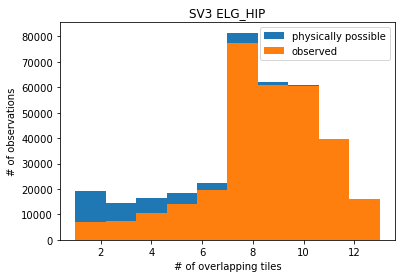

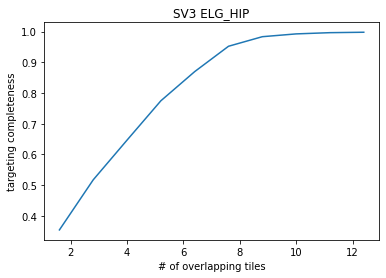

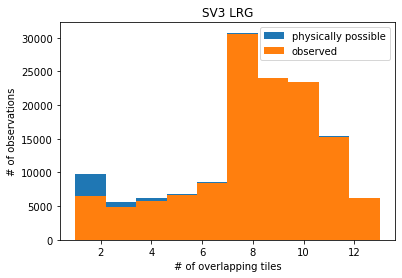

...

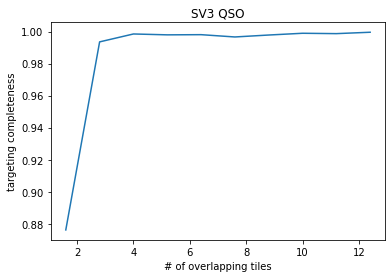

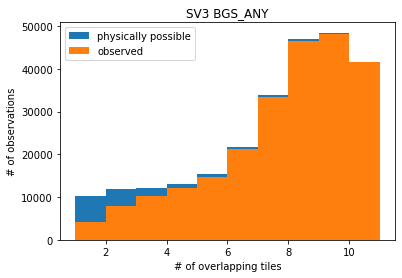

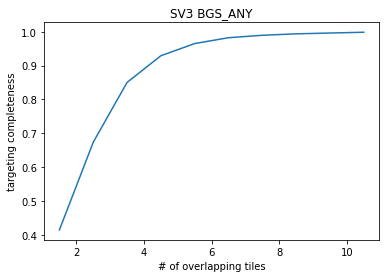

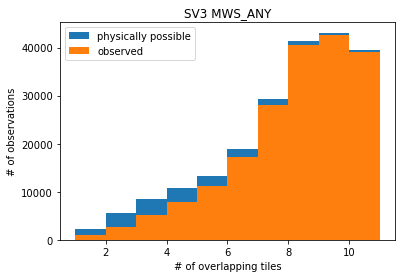

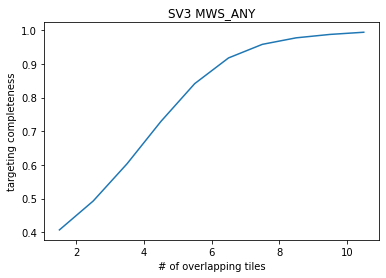

In [30]:
#look at targeting completeness as a function of number of overlapping tiles
tps = ['ELG','ELG_HIP','LRG','QSO','BGS_ANY','MWS_ANY']
for tp in tps:
    ff = fitsio.read(bdir+'daily/LSScats/1/'+tp+'Alltiles_full.dat.fits')
    a = plt.hist(ff['NTILE'],label='physically possible')
    wa = ff['FIBERSTATUS'] == 0
    b = plt.hist(ff[wa]['NTILE'],bins=a[1],label='observed')
    plt.xlabel('# of overlapping tiles')
    plt.ylabel('# of observations')
    plt.title('SV3 '+tp)
    plt.legend()
    plt.show()
    bs = a[1][1]-a[1][0]
    plt.plot(a[1][:-1]+bs/2.,b[0]/a[0])
    plt.xlabel('# of overlapping tiles')
    plt.ylabel('targeting completeness')
    plt.title('SV3 '+tp)
    
    plt.show()

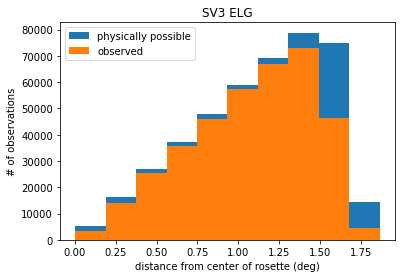

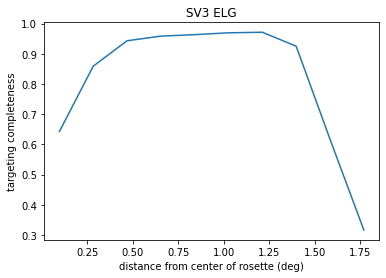

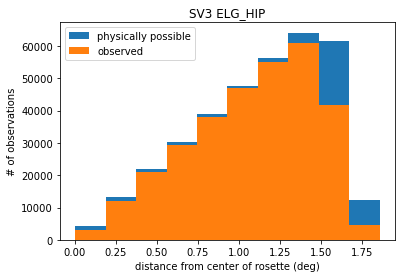

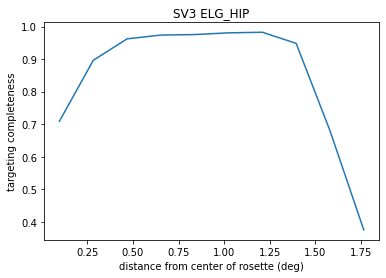

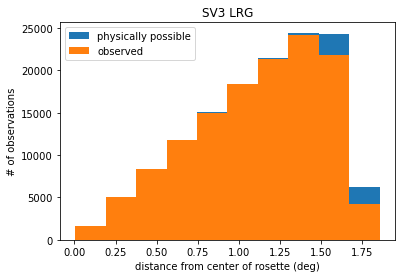

...

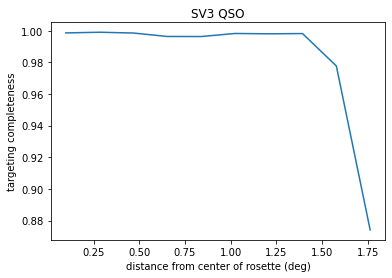

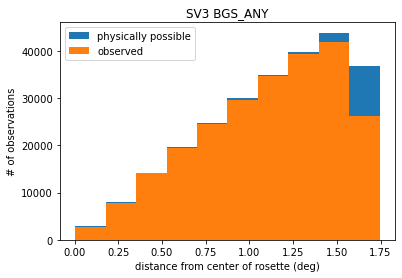

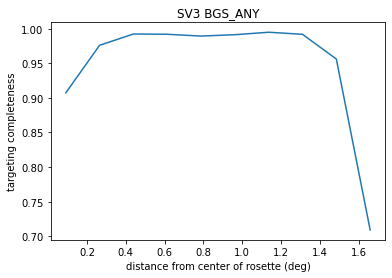

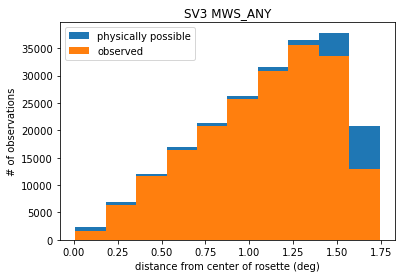

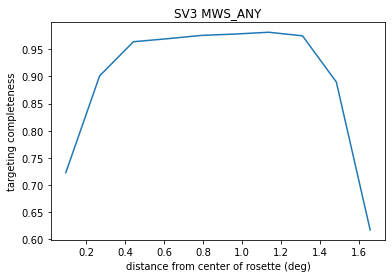

In [31]:
#look at targeting completeness as a function of distance from rosette center
tps = ['ELG','ELG_HIP','LRG','QSO','BGS_ANY','MWS_ANY']
for tp in tps:
    ff = fitsio.read(bdir+'daily/LSScats/1/'+tp+'Alltiles_full.dat.fits')
    a = plt.hist(ff['rosette_r'],label='physically possible')
    wa = ff['FIBERSTATUS'] == 0
    b = plt.hist(ff[wa]['rosette_r'],bins=a[1],label='observed')
    plt.xlabel('distance from center of rosette (deg)')
    plt.ylabel('# of observations')
    plt.title('SV3 '+tp)
    plt.legend()
    plt.show()
    bs = a[1][1]-a[1][0]
    plt.plot(a[1][:-1]+bs/2.,b[0]/a[0])
    plt.xlabel('distance from center of rosette (deg)')
    plt.ylabel('targeting completeness')
    plt.title('SV3 '+tp)
    
    plt.show()

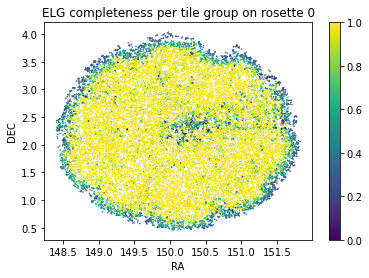

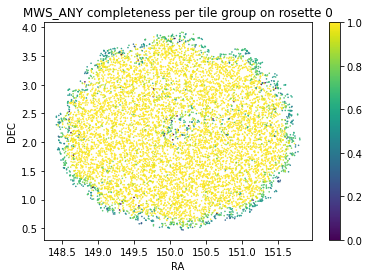

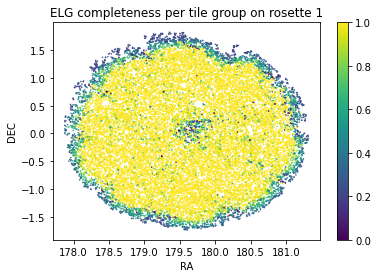

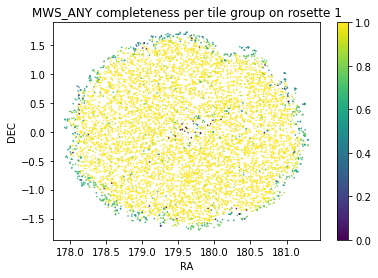

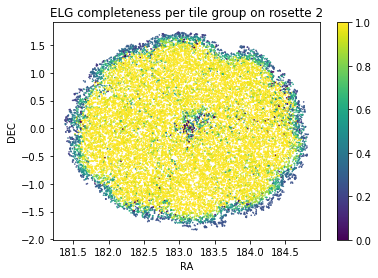

...

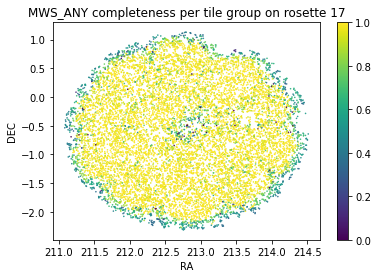

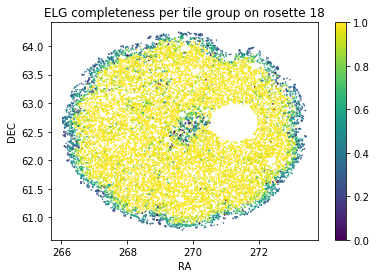

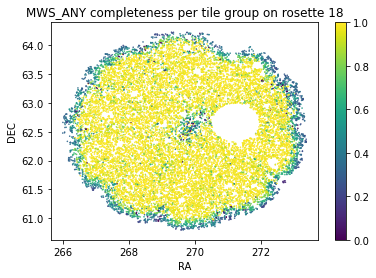

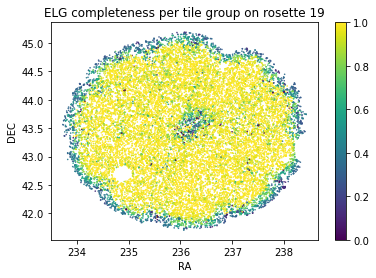

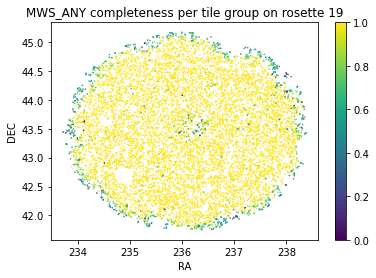

In [34]:
#now look at completeness rosette by rosette; just look at ELG and MWS, which are the least complete in dark/bright time
fe = fitsio.read(bdir+'daily/LSScats/1/ELGAlltiles_full.dat.fits')
fm = fitsio.read(bdir+'daily/LSScats/1/MWS_ANYAlltiles_full.dat.fits')
for ros in range(0,20):
    wre = fe['rosette_number'] == ros
    plt.scatter(fe[wre]['RA'],fe[wre]['DEC'],c=fe[wre]['COMP_TILE'],s=.3)
    plt.colorbar()
    plt.xlabel('RA')
    plt.ylabel('DEC')
    plt.title('ELG completeness per tile group on rosette '+str(ros))
    plt.show()
    wrm = fm['rosette_number'] == ros
    plt.scatter(fm[wrm]['RA'],fm[wrm]['DEC'],c=fm[wrm]['COMP_TILE'],s=.3)
    plt.colorbar()
    plt.xlabel('RA')
    plt.ylabel('DEC')
    plt.title('MWS_ANY completeness per tile group on rosette '+str(ros))
    plt.show()


## Finally just have the clustering catalogs that are meant to be fed directly into codes for 2pt statistics

ELG: 269141


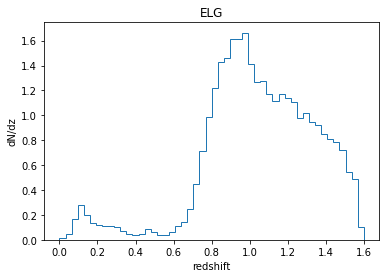

ELG_HIP: 212896


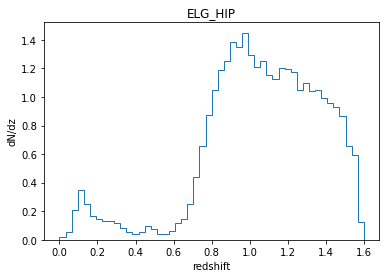

LRG: 128820


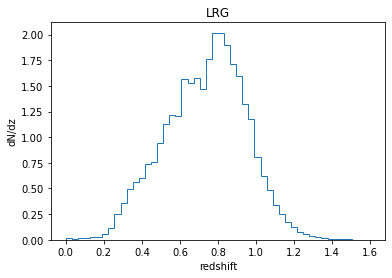

QSO: 48979


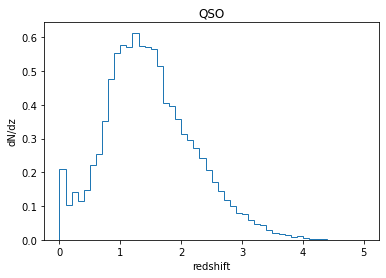

BGS_ANY: 236264


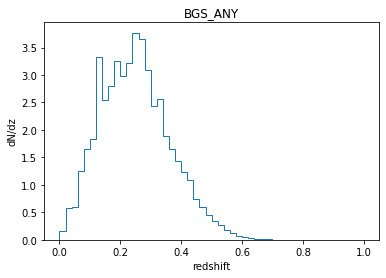

MWS_ANY: 195276


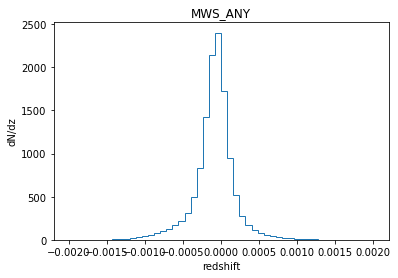

In [38]:
#just look at numbers in each and plot dN/dz
tps = ['ELG','ELG_HIP','LRG','QSO','BGS_ANY','MWS_ANY']
for tp in tps:
    if tp == 'ELG' or tp == 'ELG_HIP' or tp == 'LRG':
        rng = (0,1.6)
    if tp == 'QSO':
        rng = (0,5)
    if tp == 'BGS_ANY':
        rng = (0,1)
    if tp == 'MWS_ANY':
        rng = (-0.002,0.002)
    fc = fitsio.read(bdir+'daily/LSScats/1/'+tp+'Alltiles_clustering.dat.fits')
    print(tp+': '+str(len(fc)))
    plt.hist(fc['Z'],bins=50,density=True,weights=fc['WEIGHT'],range=rng,histtype='step')
    plt.xlabel('redshift')
    plt.ylabel('dN/dz')
    plt.title(tp)
    plt.show()


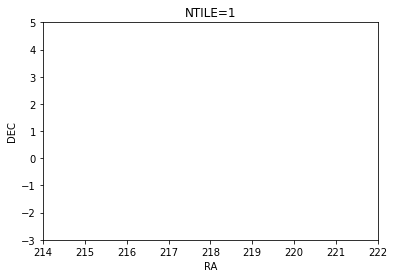

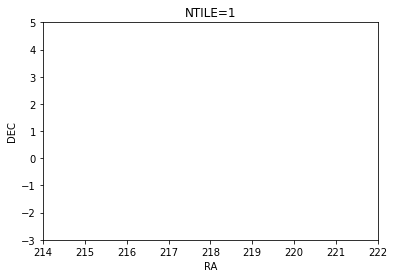

1 1.3869653767820773


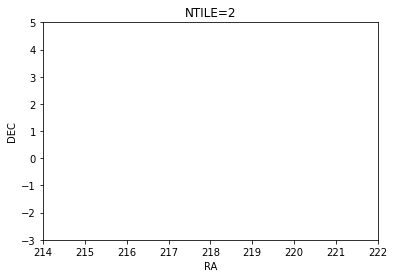

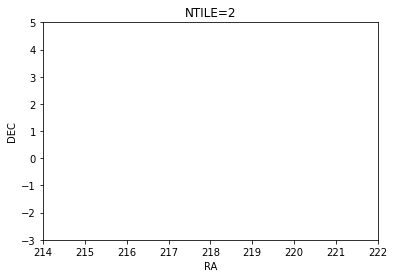

2 1.3789512830048345


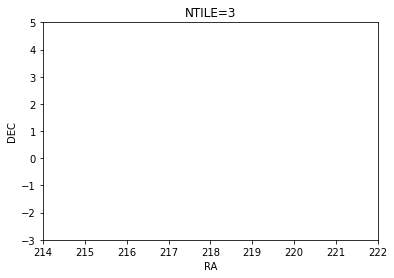

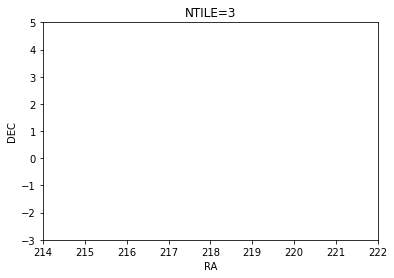

3 1.3637510844703842


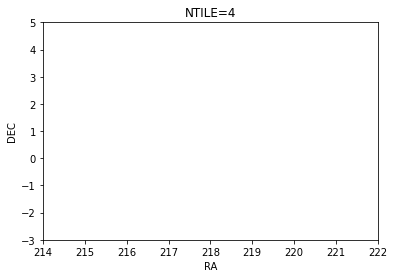

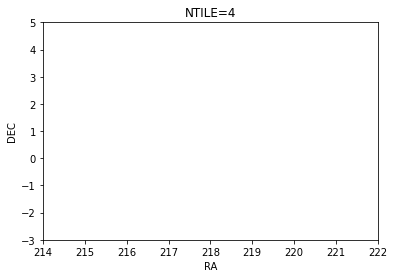

4 1.3770716585191367


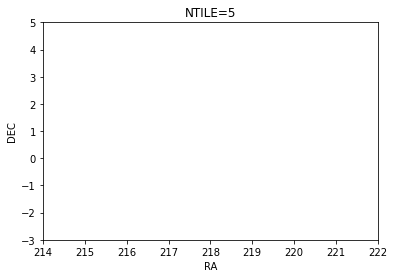

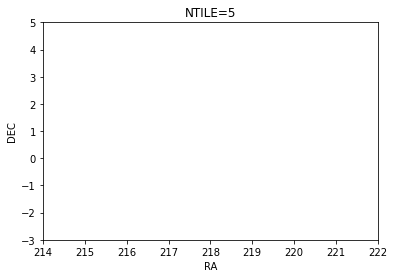

5 1.3902909943456074


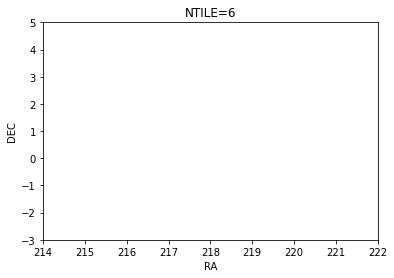

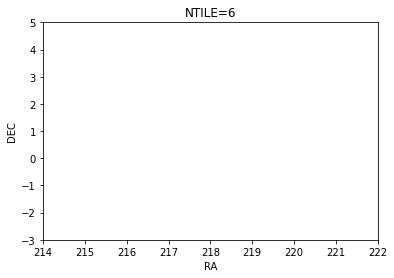

6 1.4053369942940495


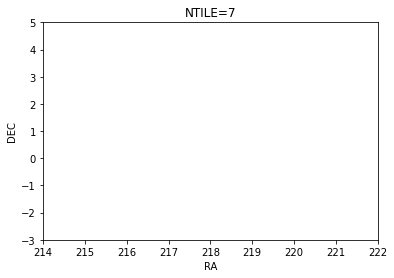

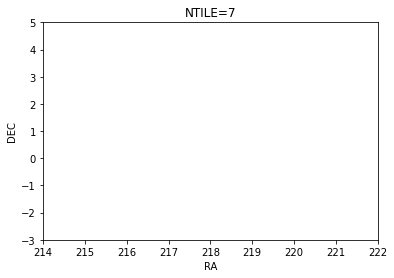

7 1.4459418987720873


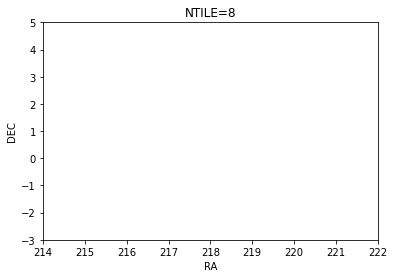

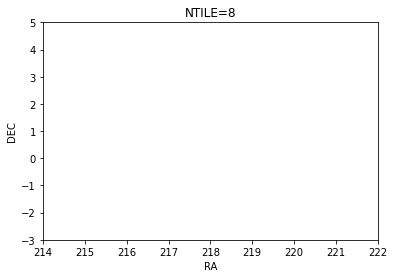

8 1.4098871574422354


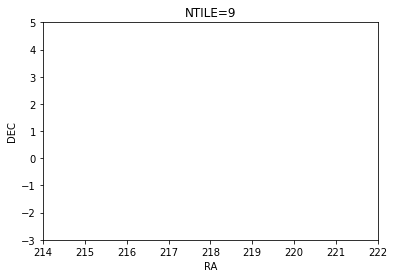

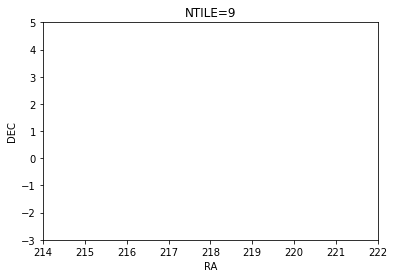

9 1.4118824336688014


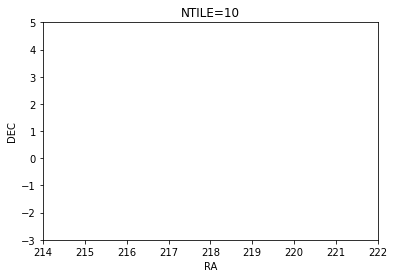

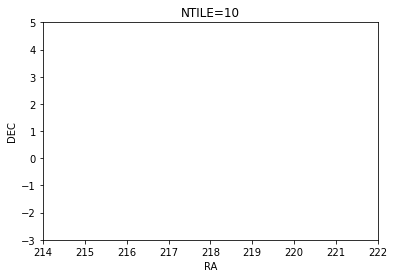

10 1.4370271784813673


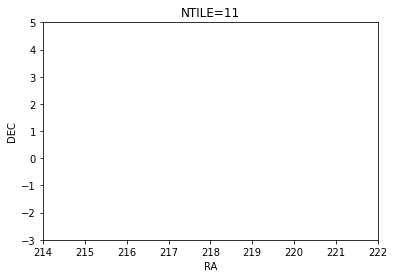

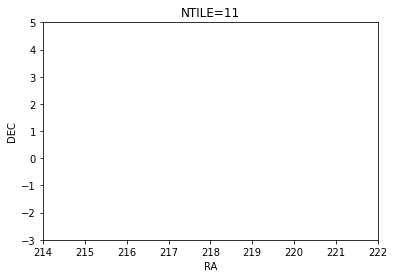

11 1.4086690571609366


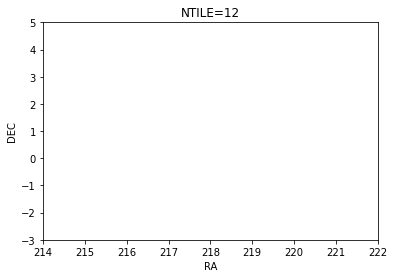

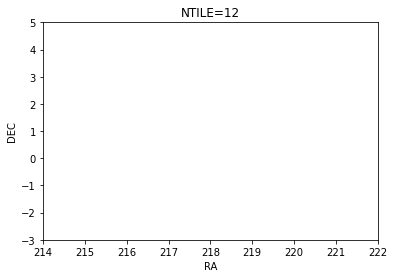

12 1.376952380952381


<ErrorbarContainer object of 3 artists>

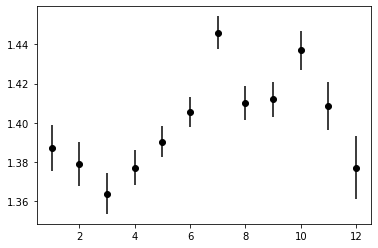

In [236]:
#fef = fitsio.read('/global/cfs/cdirs/desi/survey/catalogs/SV3/LSS/LSScats/test/ELGAlltiles_full.dat.fits')
fef = fitsio.read('/global/cfs/cdirs/desi/survey/catalogs/SV3/LSS/LSScats/test/datcomb_dark_Alltiles.fits')
ntd = np.char.count(fef['TILES'],'-')+1
#wf = (fef['FIBERSTATUS'] == 0) | (fef['FIBERSTATUS'] == 999999)
#fef = fef[wf]
#ref = fitsio.read('/global/cfs/cdirs/desi/survey/catalogs/SV3/LSS/LSScats/test/ELGAlltiles_1_full.ran.fits')
ref = fitsio.read('/global/cfs/cdirs/desi/survey/catalogs/SV3/LSS/random0/rancomb_dark_Alltiles.fits')
ntl = []
rl = []
el = []
for nt in range(1,13):
    wr = ref['NTILE'] == nt
    wr &= ref['PHOTSYS'] == 'N'
    #wr &= ref['ZPOSS'] == 1
    plt.plot(ref[wr]['RA'],ref[wr]['DEC'],'k.',ms=1)
    #wd = fef['NTILE'] == nt
    wd = ntd == nt
    wd &= fef['PHOTSYS'] == 'N'
    #wd &= fef['ZPOSS'] == 1
    plt.plot(fef[wd]['RA'],fef[wd]['DEC'],'r.',ms=1)

    plt.xlim(214,222)
    plt.ylim(-3,5)
    plt.xlabel('RA')
    plt.ylabel('DEC')
    plt.title('NTILE='+str(nt))
    plt.show()
    #wd = fef['NTILE'] == nt
    plt.plot(fef[wd]['RA'],fef[wd]['DEC'],'r.',ms=1)
 
    #wr = ref['NTILE'] == nt
    plt.plot(ref[wr]['RA'],ref[wr]['DEC'],'k.',ms=1)

    plt.xlim(214,222)
    plt.ylim(-3,5)
    plt.xlabel('RA')
    plt.ylabel('DEC')
    plt.title('NTILE='+str(nt))
    plt.show()
    if len(ref[wr]) > 0:
        print(nt,len(fef[wd])/len(ref[wr]))
        ntl.append(nt)
        rl.append(len(fef[wd])/len(ref[wr]))
        el.append(np.sqrt(len(fef[wd]))/len(ref[wr]))
plt.errorbar(ntl,rl,el,fmt='ko')    

In [217]:
fdr = fitsio.read('/global/cfs/cdirs/desi/survey/catalogs/SV3/LSS/random0/rancomb_dark_Alltiles.fits')
fdre = fitsio.read('/global/cfs/cdirs/desi/survey/catalogs/SV3/LSS/random0/rancomb_ELG_Alltiles.fits')
fdti = Table.read('/global/cfs/cdirs/desi/survey/catalogs/SV3/LSS/LSScats/test/Alltiles_dark_tilelocs.dat.fits')

In [219]:
print(len(fda),len(fdti))

532572 532572


In [225]:
print(fdti['TARGETID'][-1],fda['TARGETID'][-1])
np.array_equal(fdti['TILES'],fda['TILES'])

39633470523182256 39633470523182256


True

In [218]:
fd = Table.read('/global/cfs/cdirs/desi/survey/catalogs/SV3/LSS/LSScats/test/datcomb_ELG_Alltiles.fits')
fdl = Table.read('/global/cfs/cdirs/desi/survey/catalogs/SV3/LSS/LSScats/test/datcomb_LRG_Alltiles.fits')
fda = Table.read('/global/cfs/cdirs/desi/survey/catalogs/SV3/LSS/LSScats/test/datcomb_dark_Alltiles.fits')

In [168]:
wp = fd['ZPOSS'] == 1
print(len(fd)/len(fd[wp]))
wpr = fdre['ZPOSS'] == 1
print(len(fdre)/len(fdre[wpr]))

1.087226816868828
1.0921218474664598


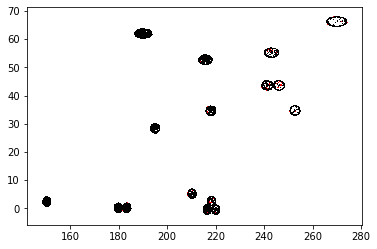

In [169]:
plt.plot(fd[~wp]['RA'],fd[~wp]['DEC'],'r,')
plt.plot(fdre[~wpr]['RA'],fdre[~wpr]['DEC'],'k,')
#plt.xlim(239,246)
#plt.ylim(53,57)
plt.show()
#plt.plot(fdre[wpr]['RA'],fdre[wpr]['DEC'],'k,')
#plt.plot(fd[~wp]['RA'],fd[~wp]['DEC'],'r,')
#plt.xlim(239,246)
#plt.ylim(53,57)


In [147]:
wz = fd['LOCATION_ASSIGNED'] == 1
loclz,nloclz = np.unique(fd[wz]['TILELOCID_ASSIGNED'],return_counts=True)

In [148]:
print(np.max(nloclz),np.min(loclz))

1 10000.0


In [149]:
natloc = ~np.isin(fd[wp]['TILELOCID'],loclz)

In [150]:
np.sum(natloc)

7815

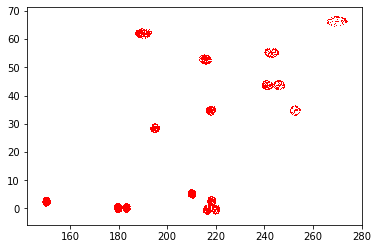

In [146]:
plt.plot(fd[wp][natloc]['RA'],fd[wp][natloc]['DEC'],'r,')

In [176]:
fd = join(fd,fdti,keys=['TARGETID'])
fda = join(fda,fdti,keys=['TARGETID'])

In [177]:
fdl = join(fdl,fdti,keys=['TARGETID'])

In [190]:
np.unique(fd['LOCATION_AVAIL'])

0
1
2
3
4
5
6
7
8
9
10


In [204]:
fd = fitsio.read('/global/cfs/cdirs/desi/survey/catalogs/SV3/LSS/LSScats/test/datcomb_dark_Alltiles.fits')
wd = fd['LOCATION'] != 999999
wd &= fd['FIBERSTATUS'] == 0
wd &= fd['LOCATION_ASSIGNED'] == 1
wd &= np.sqrt(fd['DELTA_X']**2.+fd['DELTA_Y']**2.)*0 == 0
dd = np.sqrt(fd[wd]['DELTA_X']**2.+fd[wd]['DELTA_Y']**2.)
fdd = fd[wd]
ddm = np.median(dd)
print(ddm)
for loc in np.unique(fdd['LOCATION']):
    wl = fdd['LOCATION'] == loc
    dm = np.median(dd[wl])
    if dm > 2*ddm:
        print(loc, dm,len(dd[wl]))
#a = np.histogram(fd['LOCATION'])
#fd.dtype.names

0.00670820393249937
278 0.04813506479234292 30
2087 0.01730557512932649 6
2096 0.03354101966249685 7
2098 0.018248287590894658 7
4332 0.037 13
4375 0.015 95
6248 0.07464415208703506 4


In [178]:
def tile2rosette(tile):
    return (tile-1)//27

NT = np.zeros(len(fd))
ros = np.zeros(len(fd))
for ii in range(0,len(fd['TILES'])): #not sure why, but this only works when using loop for Table.read but array option works for fitsio.read
    NT[ii] = np.char.count(fd['TILES'][ii],'-')+1
    #tiles = dz['TILES'][ii].split('-')
    #ti = int(tiles[0])
    ti = fd['TILE'][ii]
    ros[ii] = tile2rosette(ti)
#    if ii%10000 == 0:
#        print(ii,ti,ros[ii],nch,nbl)

In [179]:
NTa = np.zeros(len(fda))
rosa = np.zeros(len(fda))
for ii in range(0,len(fda['TILES'])): #not sure why, but this only works when using loop for Table.read but array option works for fitsio.read
    NTa[ii] = np.char.count(fda['TILES'][ii],'-')+1
    #tiles = dz['TILES'][ii].split('-')
    #ti = int(tiles[0])
    ti = fda['TILE'][ii]
    rosa[ii] = tile2rosette(ti)


In [90]:
NTl = np.zeros(len(fdl))
rosl = np.zeros(len(fdl))
for ii in range(0,len(fdl['TILES'])): #not sure why, but this only works when using loop for Table.read but array option works for fitsio.read
    NTl[ii] = np.char.count(fdl['TILES'][ii],'-')+1
    #tiles = dz['TILES'][ii].split('-')
    #ti = int(tiles[0])
    ti = fdl['TILE'][ii]
    rosl[ii] = tile2rosette(ti)


In [180]:
#fd['NTILE'] = NT
fda['NTILE'] = NTa

In [91]:
fdl['NTILE'] = NTl

1 1.4535931567631857
2 1.4620830333573314
3 1.445725171122304
4 1.4710912632429094
5 1.4888462374158036
6 1.4936319874948931
7 1.5284448908775454
8 1.4967079897977342
9 1.4627808655170775
10 1.4370271784813673
11 1.4086690571609366
12 1.376952380952381


<ErrorbarContainer object of 3 artists>

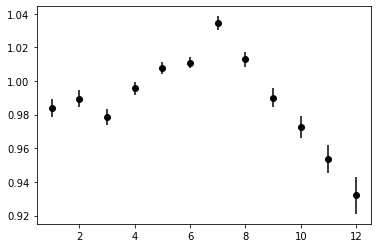

In [181]:
#w = fdr['MASKBITS'] == 0
#fdrm = fdr[w]
w = fd['MASKBITS'] == 0
fdm = fd[w]
w = fdl['MASKBITS'] == 0
fdlm = fdl[w]
ntl = []
rl = []
el = []
rll = []
ell = []
norml = len(fdr)/len(fdlm)
norm = len(fdr)/len(fda)
for nt in range(1,13):
    wr = fdr['NTILE'] == nt
    wd = fda['NTILE'] == nt
    #wdl = fdlm['NTILE'] == nt
    print(nt,len(fda[wd])/len(fdr[wr]))
    ntl.append(nt)
    rl.append(len(fda[wd])/len(fdr[wr])*norm)
    el.append(np.sqrt(len(fda[wd]))/len(fdr[wr])*norm)
    #rll.append(len(fdlm[wdl])/len(fdrm[wr])*norml)
    #ell.append(np.sqrt(len(fdlm[wdl]))/len(fdrm[wr])*norml)

plt.errorbar(ntl,rl,el,fmt='ko')  
#plt.errorbar(ntl,rll,ell,fmt='rd')  

1 1.0
2 1.0
3 1.0
4 1.0
5 1.0
6 1.0
7 1.0
8 1.0
9 1.0
10 1.0
11 1.0
12 1.0


<ErrorbarContainer object of 3 artists>

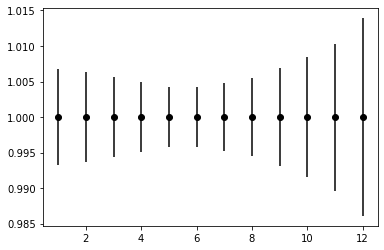

In [66]:
ntl = []
rl = []
el = []
for nt in range(1,13):
    wr = fdr['NTILE'] == nt
    wd = fdre['NTILE'] == nt
    print(nt,len(fdre[wd])/len(fdr[wr]))
    ntl.append(nt)
    rl.append(len(fdre[wd])/len(fdr[wr]))
    el.append(np.sqrt(len(fdre[wd]))/len(fdr[wr]))
plt.errorbar(ntl,rl,el,fmt='ko')    

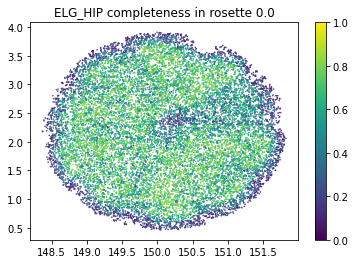

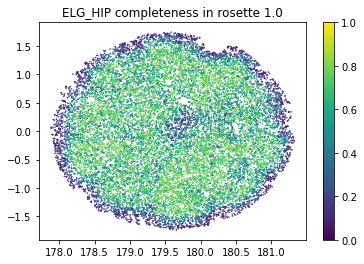

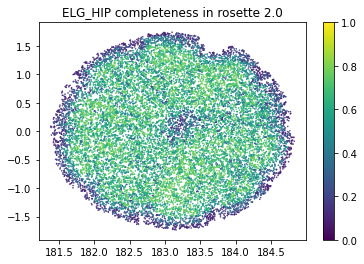

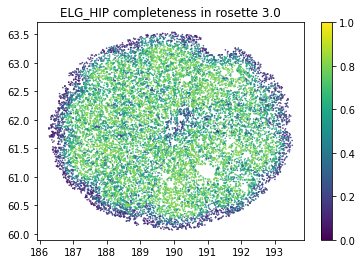

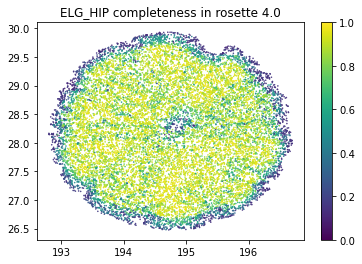

...

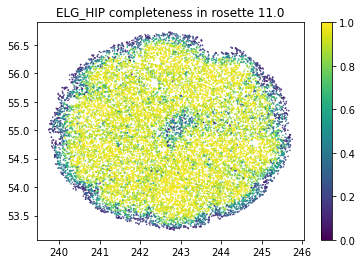

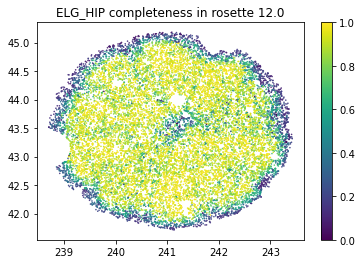

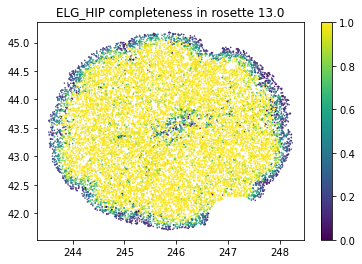

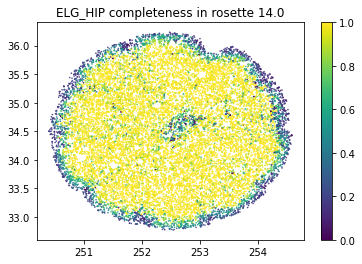

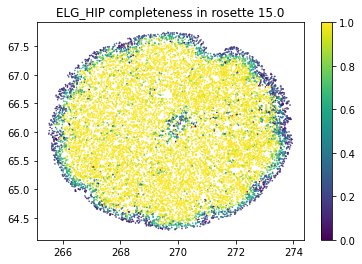

In [15]:
#Look at completeness per rosette
fef = fitsio.read('/global/cfs/cdirs/desi/survey/catalogs/SV3/LSS/LSScats/test/ELG_HIPAlltiles_full.dat.fits')
for ros in np.unique(fef['rosette_number']):
    wr = fef['rosette_number'] == ros
    plt.scatter(fef[wr]['RA'],fef[wr]['DEC'],c=fef[wr]['COMP_TILE'],s=.3,vmax=1,vmin=0)
    plt.title('ELG_HIP completeness in rosette '+str(ros))
    plt.colorbar()
    plt.show()

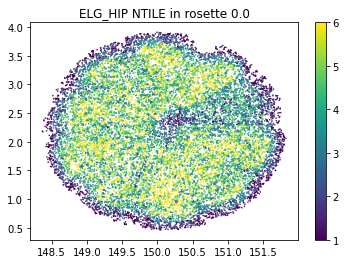

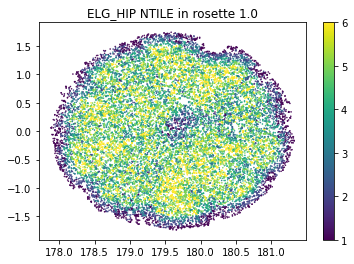

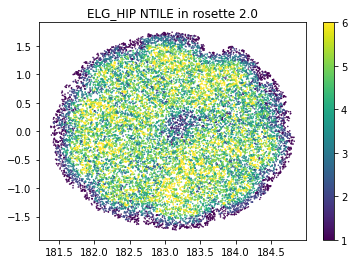

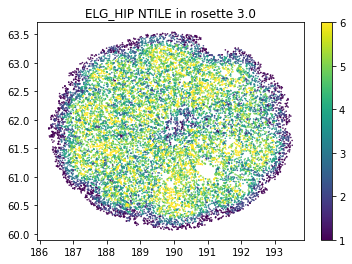

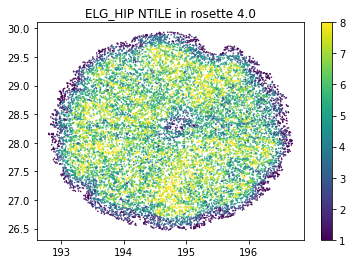

...

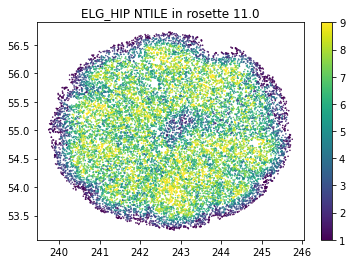

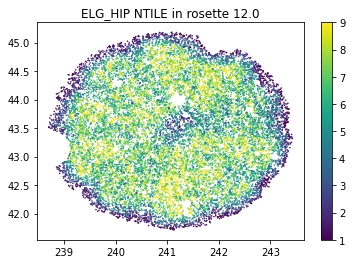

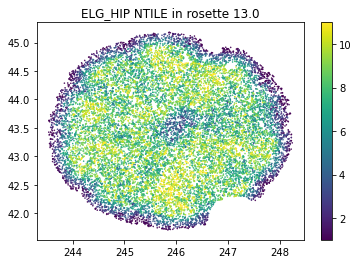

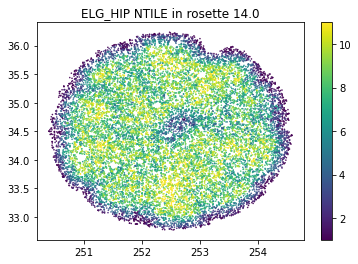

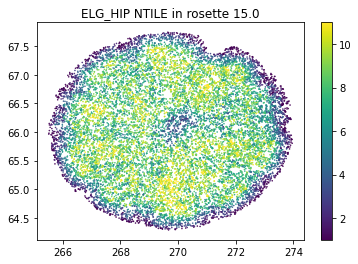

In [17]:
#Look at NTILE per rosette
fef = fitsio.read('/global/cfs/cdirs/desi/survey/catalogs/SV3/LSS/LSScats/test/ELG_HIPAlltiles_full.dat.fits')
for ros in np.unique(fef['rosette_number']):
    wr = fef['rosette_number'] == ros
    plt.scatter(fef[wr]['RA'],fef[wr]['DEC'],c=fef[wr]['NTILE'],s=.3)#,vmax=1,vmin=0)
    plt.title('ELG_HIP NTILE in rosette '+str(ros))
    plt.colorbar()
    plt.show()

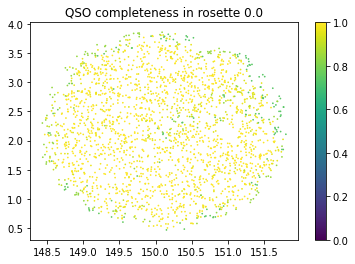

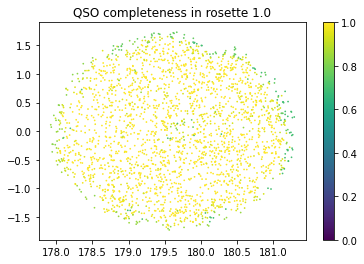

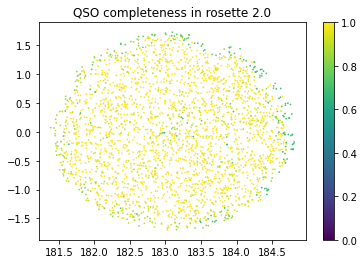

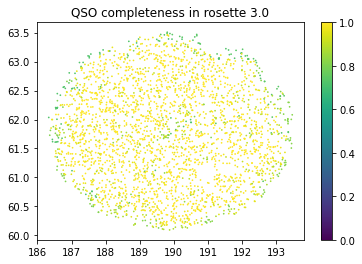

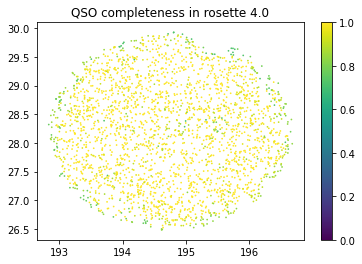

...

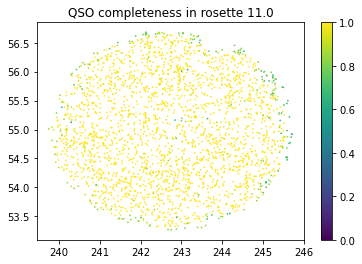

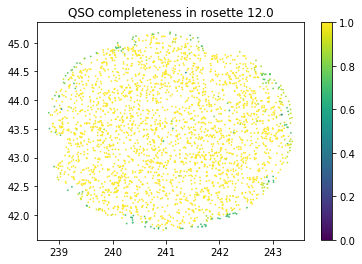

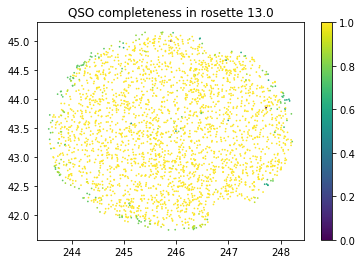

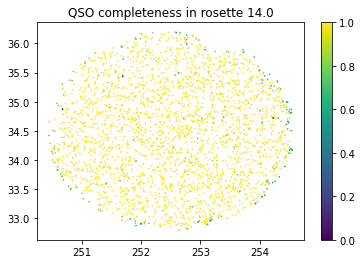

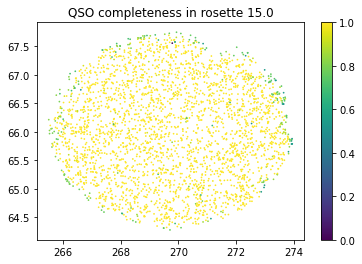

In [114]:
#Look at completeness per rosette
for ros in np.unique(fqf['rosette_number']):
    wr = fqf['rosette_number'] == ros
    plt.scatter(fqf[wr]['RA'],fqf[wr]['DEC'],c=fqf[wr]['COMP_TILE'],s=.5,vmax=1,vmin=0)
    plt.title('QSO completeness in rosette '+str(ros))
    plt.colorbar()
    plt.show()

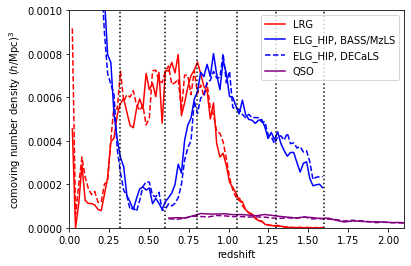

In [30]:
#plot n(z)
nz = np.loadtxt('/global/cfs/cdirs/desi/survey/catalogs/SV3/LSS/LSScats/test/LRG_N_nz.dat').transpose()
plt.plot(nz[0],nz[3],'r-',label='LRG')
nz = np.loadtxt('/global/cfs/cdirs/desi/survey/catalogs/SV3/LSS/LSScats/test/LRG_S_nz.dat').transpose()
plt.plot(nz[0],nz[3],'r--')
nz = np.loadtxt('/global/cfs/cdirs/desi/survey/catalogs/SV3/LSS/LSScats/test/ELG_HIP_N_nz.dat').transpose()
plt.plot(nz[0],nz[3],'b-',label='ELG_HIP, BASS/MzLS')
nz = np.loadtxt('/global/cfs/cdirs/desi/survey/catalogs/SV3/LSS/LSScats/test/ELG_HIP_S_nz.dat').transpose()
plt.plot(nz[0],nz[3],'b--',label='ELG_HIP, DECaLS')
plt.ylim(0,.001)
nz = np.loadtxt('/global/cfs/cdirs/desi/survey/catalogs/SV3/LSS/LSScats/test/QSO_N_nz.dat').transpose()
plt.plot(nz[0],nz[3],'-',color='purple',label='QSO')
nz = np.loadtxt('/global/cfs/cdirs/desi/survey/catalogs/SV3/LSS/LSScats/test/QSO_S_nz.dat').transpose()
plt.plot(nz[0],nz[3],'--',color='purple')
plt.legend()
plt.xlim(0,2.1)
xl = [0.32,0.32]
yl = [0,0.001]
plt.plot(xl,yl,'k:')
xl = [0.6,0.6]
yl = [0,0.001]
plt.plot(xl,yl,'k:')
xl = [0.8,0.8]
yl = [0,0.001]
plt.plot(xl,yl,'k:')
xl = [1.05,1.05]
yl = [0,0.001]
plt.plot(xl,yl,'k:')
xl = [1.3,1.3]
yl = [0,0.001]
plt.plot(xl,yl,'k:')
xl = [1.6,1.6]
yl = [0,0.001]
plt.plot(xl,yl,'k:')
plt.xlabel('redshift')
plt.ylabel(r'comoving number density ($h$/Mpc)$^3$')
plt.show()

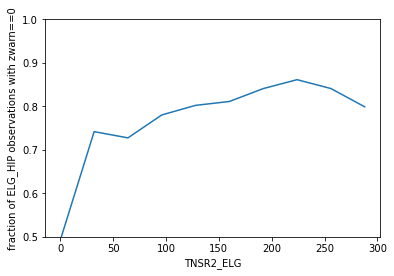

In [36]:
#look at redshift success vs TSNR
wo = fef['LOCATION_ASSIGNED'] == 1 #select the locations that were assigned
wz = fef['ZWARN'] == 0 #how we are currently selecting good redshifts
a = plt.hist(fef[wo]['TSNR2_ELG'],range=(0,320))
b = plt.hist(fef[wo&wz]['TSNR2_ELG'],range=(0,320),histtype='step')
plt.clf()
plt.plot(a[1][:-1],b[0]/a[0])
plt.xlabel('TNSR2_ELG')
plt.ylabel('fraction of ELG_HIP observations with zwarn==0')
plt.ylim(0.5,1)
plt.show()

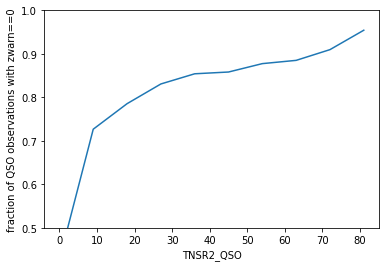

In [46]:
#look at redshift success vs TSNR for QSO
wo = fqf['LOCATION_ASSIGNED'] == 1 #select the locations that were assigned
wl = fqf['TSNR2_QSO'] != 1e+20 #for some reason there are ~100 of these, this is the null value
wz = fqf['ZWARN'] == 0 #how we are currently selecting good redshifts
a = plt.hist(fqf[wo]['TSNR2_QSO'],range=(0,90))
b = plt.hist(fqf[wz]['TSNR2_QSO'],range=(0,90),histtype='step')
plt.clf()
plt.plot(a[1][:-1],b[0]/a[0])
plt.xlabel('TNSR2_QSO')
plt.ylabel('fraction of QSO observations with zwarn==0')
plt.ylim(0.5,1)
plt.show()

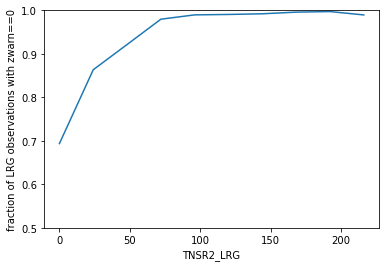

In [51]:
flf = fitsio.read('/global/cfs/cdirs/desi/survey/catalogs/SV3/LSS/LSScats/test/LRGAlltiles_full.dat.fits')
wo = flf['LOCATION_ASSIGNED'] == 1 #select the locations that were assigned
wl = flf['TSNR2_LRG'] != 1e+20 #for some reason there are ~100 of these, this is the null value
wz = flf['ZWARN'] == 0 #how we are currently selecting good redshifts
a = plt.hist(flf[wo]['TSNR2_LRG'],range=(0,240))
b = plt.hist(flf[wz]['TSNR2_LRG'],range=(0,240),histtype='step')
plt.clf()
plt.plot(a[1][:-1],b[0]/a[0])
plt.xlabel('TNSR2_LRG')
plt.ylabel('fraction of LRG observations with zwarn==0')
plt.ylim(0.5,1)
plt.show()

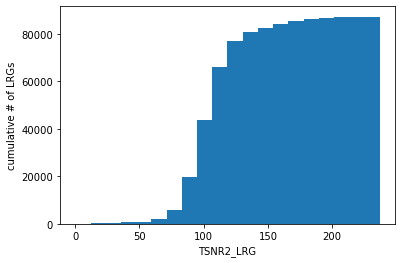

In [57]:
plt.hist(flf[wo&wl]['TSNR2_LRG'],bins=20,cumulative=True)
plt.xlabel('TSNR2_LRG')
plt.ylabel('cumulative # of LRGs')
plt.show()

In [49]:
np.max(flf[wo&wz&wl]['TSNR2_LRG'])

236.83165